##  Setup

In [534]:
import librosa as lr
import matplotlib as mpl
import numpy as np
import pandas as pd
import scipy.signal
import warnings
from ftplib import FTP
from glob import glob
from IPython.display import clear_output, display, Audio, HTML, Markdown
from matplotlib import pyplot as plt
from matplotlib.animation import FuncAnimation
from tqdm.notebook import tqdm

mpl.style.use('ggplot')
mpl.rcParams['figure.figsize'] = (16, 3)
plt.set_cmap('hot')
plt.close()

π = np.pi
fs = 48000
frames = np.interp(range(100), [0, 50, 100], [0, 1, 0])

warnings.filterwarnings('ignore',
                        module='librosa.core',
                        message='PySoundFile failed',
                        category=UserWarning)


## Background

![](fft.png)


### Joseph Fourier

![](https://kids.kiddle.co/images/d/d5/Legendre_and_Fourier_%281820%29.jpg)


### John Tukey, Master of Names


![](tukey.png)

|english|tukish|
|---|---|
||software|
||bit|
|analysis|alanysis|
|filtering|liftering|
|frequency|quefrency|
|spectrum|cepstrum|
|period|repiod|
|magnitude|gamnitude|
|phase|saphe|
|harmonics|rahmonics|
|low-pass filter|short-pass lifter|


## What is the Discrete Fourier Transform?


<center>
$
\huge
X_k = \sum_{n=0}^{N-1} x_n e^{-i~2\pi~k~n~/~N} 
$
</center>

&nbsp;

<center>

## This is just an NxN matrix-vector multiplication.

</center>

### Euler's Formula


<center>
$
\huge
e^{ i\theta } = \cos \theta + i\sin \theta
$
</center>


<center>
$
\huge
e^{ i\pi } + 1 = 0
$
</center>


### Simple Sinusoid

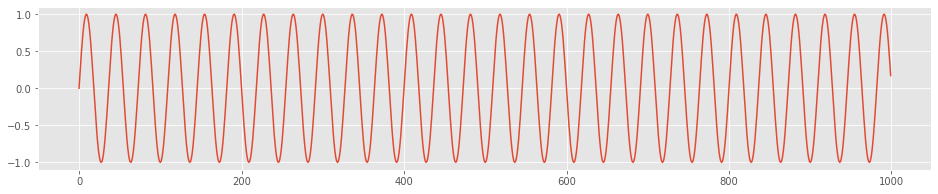

signal energy: 0.50


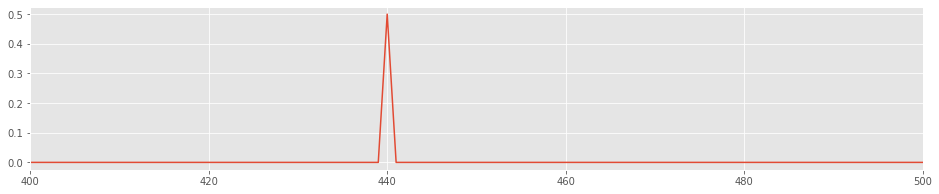

peak spectral energy: 0.50


In [531]:
# time-domain signal
f = 440
x = 2*π*np.arange(fs)/fs
y = np.sin(f*x)

display(Audio(y, rate=fs, autoplay=False))

plt.plot(y[:1000])
plt.show()

print(f'signal energy: {np.square(y).mean():.2f}')

# frequency-domain transform
N = len(y)
Y = np.fft.rfft(y[:N])/N

plt.xlim(400, 500)
plt.plot(np.linspace(0, fs/2, N//2+1), np.abs(Y))
plt.show()

print(f'peak spectral energy: {np.abs(Y).max():.2f}')


### Harmonics

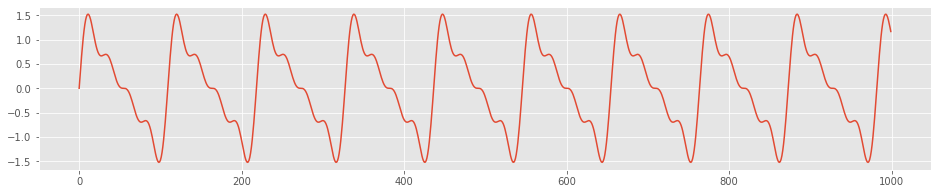

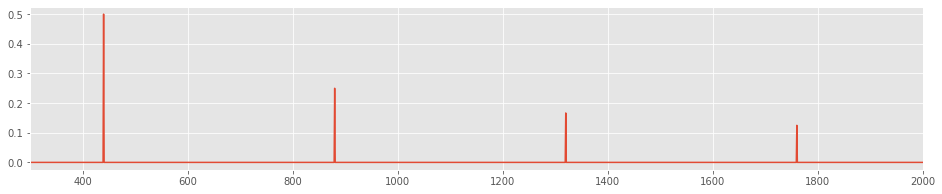

In [484]:
# time-domain signal
f = 440
x = 2*π*np.arange(fs)/fs
y = sum(np.sin(i*f*x)/i for i in range(1, 5))

display(Audio(y, rate=fs, autoplay=False))
plt.figure(figsize=(16, 3))
plt.plot(y[:1000])
plt.show()

# frequency-domain transform
N = len(y)
Y = np.fft.rfft(y[:N])/N

plt.figure(figsize=(16, 3))
plt.xlim(300, 2000)
plt.plot(np.linspace(0, fs/2, N//2+1), np.abs(Y))
plt.show()


### White Noise

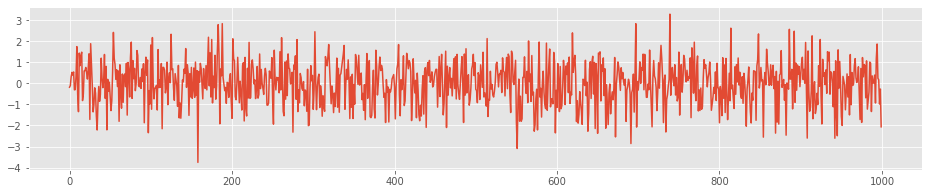

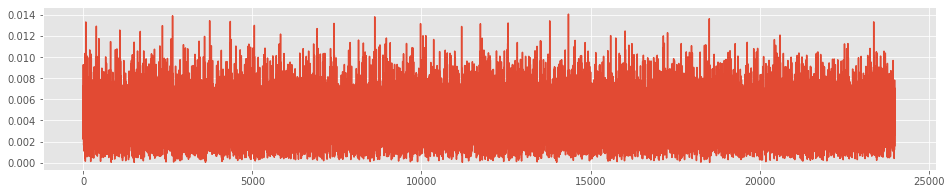

In [485]:
# time-domain signal
y = np.random.normal(size=fs)

display(Audio(y, rate=fs, autoplay=False))
plt.figure(figsize=(16, 3))
plt.plot(y[:1000])
plt.show()

# frequency-domain transform
N = len(y)
Y = np.fft.rfft(y[:N])/N

plt.figure(figsize=(16, 3))
plt.plot(np.linspace(0, fs/2, N//2+1), np.abs(Y))
plt.show()


### Square Wave

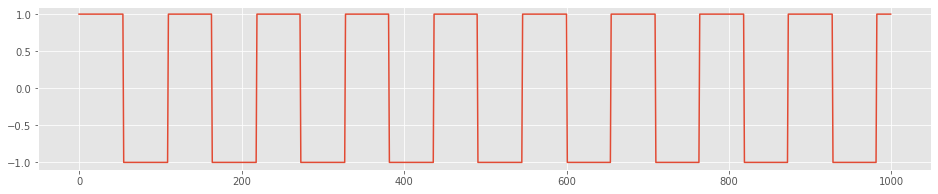

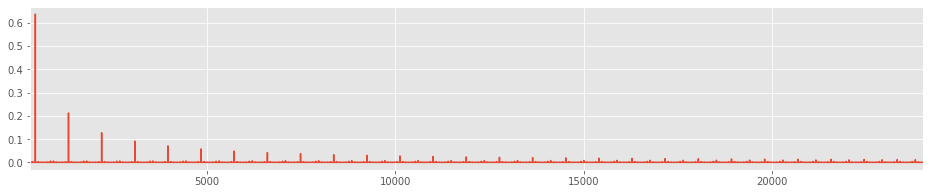

In [535]:
# time-domain signal
f = 440
x = 2*π*np.arange(fs)/fs
y = scipy.signal.square(f*x)

display(Audio(y, rate=fs, autoplay=False))

plt.plot(y[:1000])
plt.show()

# frequency-domain transform
N = len(y)
Y = np.fft.rfft(y[:N])/N

plt.xlim(300, 24000)
plt.plot(np.linspace(0, fs/2, N//2+1), np.abs(Y))
plt.show()


### Fourier Assumption

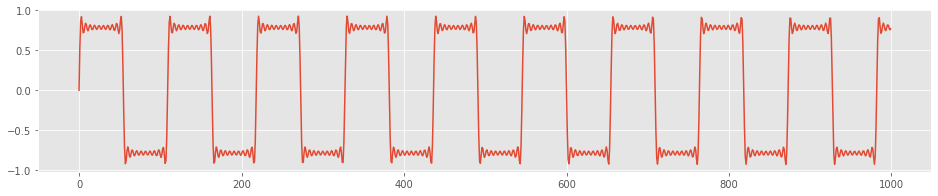

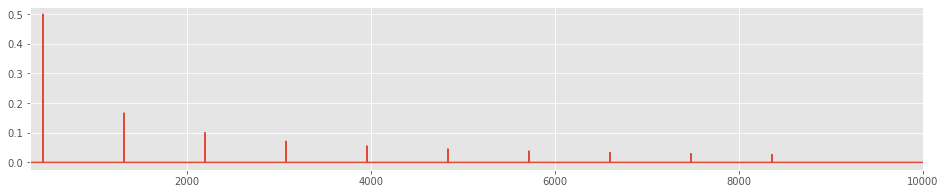

In [487]:
# time-domain signal
f = 440
x = 2*π*np.arange(fs)/fs

y = sum(np.sin(i*f*x)/i for i in range(1, 20, 2))
plt.plot(y[:1000])
plt.show()

# frequency-domain transform
N = len(y)
Y = np.fft.rfft(y[:N])/N

plt.xlim(300, 10000)
plt.plot(np.linspace(0, fs/2, N//2+1), np.abs(Y))
plt.show()


### Inverse Transform

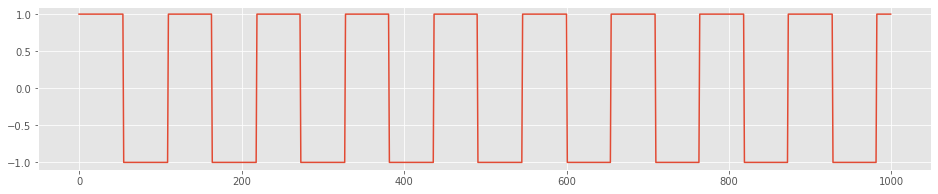

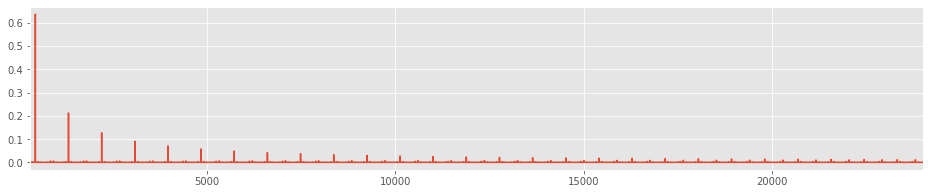

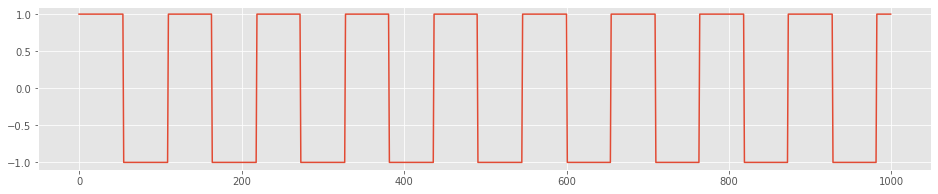

In [568]:
# time-domain signal
f = 440
x = 2*π*np.arange(fs)/fs
y = scipy.signal.square(f*x)

display(Audio(y, rate=fs, autoplay=False))

plt.plot(y[:1000])
plt.show()

# frequency-domain transform
N = len(y)
Y = np.fft.fft(y)

plt.xlim(300, 24000)
plt.plot(np.linspace(0, fs/2, N//2), np.abs(Y/N)[:N//2])
plt.show()

# time-domain inverse transform
y = np.fft.ifft(Y)

plt.plot(y[:1000].real)
plt.show()

display(Audio(y.real, rate=fs, autoplay=False))


## The Slow Fourier Transform: O(n²)

In [501]:
def fft(y):
    M = [[np.exp(-1j*2*π*k*n/len(y)) 
          for k in range(len(y))] 
         for n in range(len(y))]

    return M @ y
    
y = np.random.uniform(size=[2048])
Y = fft(y)

print(f"{len(y)} · {len(y)}x{len(y)} = {len(Y)}")


2048 · 2048x2048 = 2048


## The Fast Fourier Transform: O(nlog(n))

### Transform Symmetries

In [489]:
fig, ax = plt.subplots(1, 2, figsize=(16, 8))
im = []
titles = ['real', ]
for a, t in zip(ax, ['real', 'imaginary']):
    a.get_xaxis().set_visible(False)
    a.get_yaxis().set_visible(False)
    a.set_title(t)
    im.append(a.imshow(np.zeros((0, 0)), extent=(0, 1, 0, 1), vmin=-1, vmax=1, aspect='auto'))

fig.tight_layout()
plt.close()

def animate(frame):
    c = int(frame * 10) + 1
    x = np.random.uniform(size=[2 ** c])
    n = np.arange(len(x))
    k = n[:, np.newaxis]
    M = np.exp(-1j * 2 * π * k * n / len(x))
    im[0].set_data(np.real(M))
    im[1].set_data(np.imag(M))
    return im

anim = FuncAnimation(fig, animate, frames=frames[::10], interval=600, blit=True)
HTML(anim.to_html5_video())


### Simple Implementation

In [490]:
def fft(y):
    N = y.shape[0]
    
    # FFT only works for powers of 2, use padding for other sizes
    assert N&-N == N

    # compute the base/small case using slow matrix multiplication
    N_min = min(N, 32)    
    y = y.reshape((N_min, N//N_min))
    n = np.arange(N_min)
    k = n[:, np.newaxis]
    M = np.exp(-2j*π*n*k/N_min)
    Y = M@y

    # build-up each level of the recursive calculation
    while Y.shape[0] < N:
        X_evn = Y[:, :Y.shape[1] // 2]
        X_odd = Y[:, Y.shape[1] // 2:]
        factor = np.exp(-1j*π*np.arange(Y.shape[0])/Y.shape[0])[:, np.newaxis]
        Y = np.vstack([X_evn + factor * X_odd,
                       X_evn - factor * X_odd])

    return Y[:, 0]

y = np.random.uniform(size=[2048])
Y = fft(y)


### C

![](fftc.png)

![](https://avatars3.githubusercontent.com/u/7785283)
![](http://www.fftw.org/fftw-logo-med.gif)
![](fftw.png)


![](https://avatars1.githubusercontent.com/u/1224566)
![](ffts.png)

## Applications

### Speech Analysis

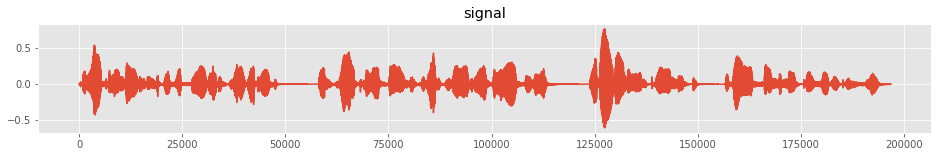

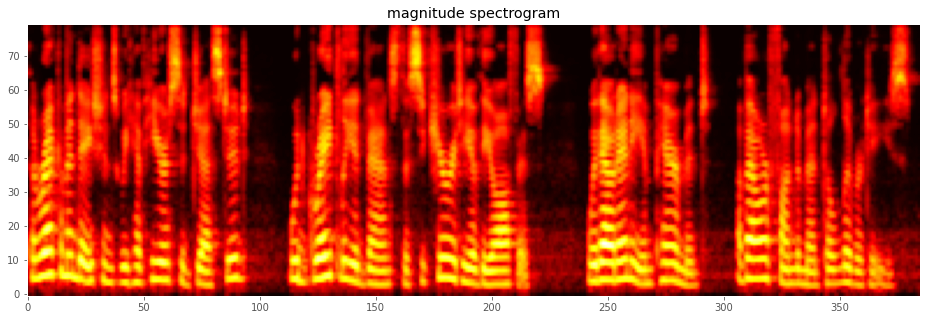

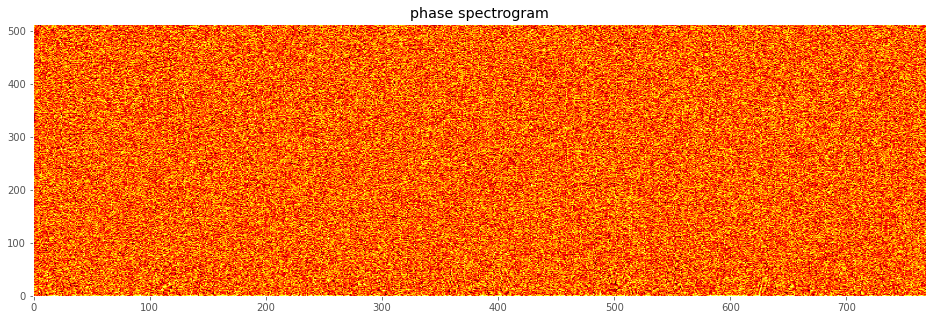

In [517]:
y, fs = lr.load('speech.wav', sr=None)
display(Audio(y, rate=fs))

plt.figure(figsize=(16, 2))
plt.title('signal')
plt.plot(y)
plt.show()

Y = np.log(lr.feature.melspectrogram(y, sr=fs, n_mels=80) + 1e-5)
plt.figure(figsize=(16, 5))
plt.title('magnitude spectrogram')
plt.grid(False)
plt.imshow(Y, aspect='auto', origin='lower')
plt.show()


### Speech with Noise

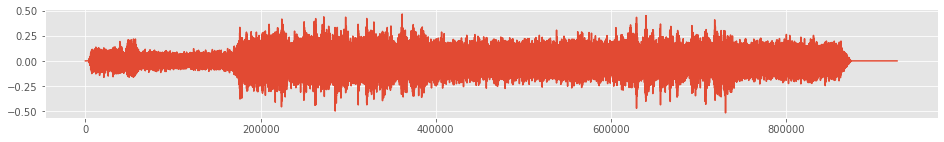

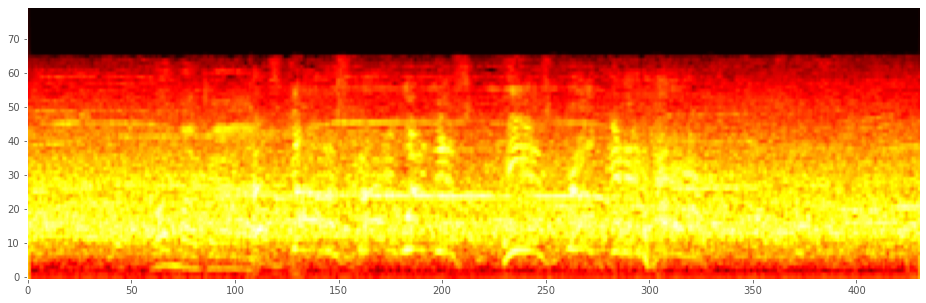

In [569]:
y, fs = lr.load('hellinacell.mp3', sr=None)
display(Audio(y, rate=fs))

plt.figure(figsize=(16, 2))
plt.plot(y)
plt.show()

Y = np.log(lr.feature.melspectrogram(y[13*fs:][:5*fs], sr=fs, n_mels=80) + 1e-5)

plt.figure(figsize=(16, 5))
plt.grid(False)
plt.imshow(Y, aspect='auto', origin='lower')
plt.show()


### Vocoder Music

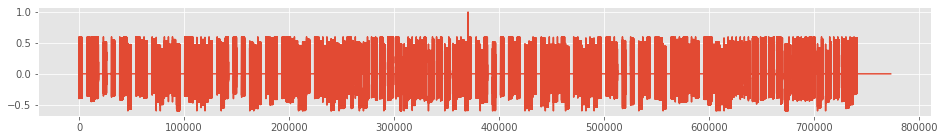

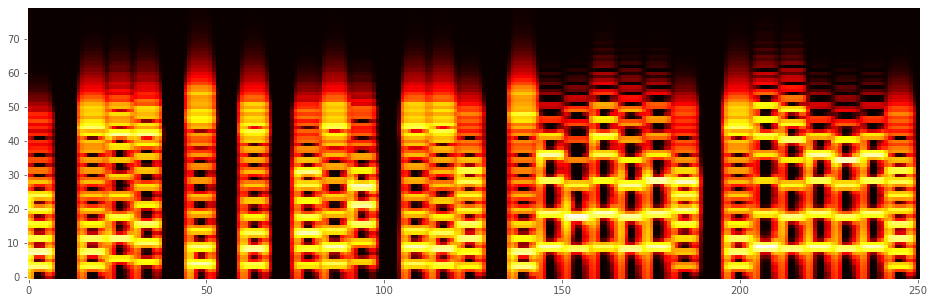

In [570]:
y, fs = lr.load('coffin.wav', sr=None)
display(Audio(y, rate=fs))

plt.figure(figsize=(16, 2))
plt.plot(y)
plt.show()

S = np.log(lr.feature.melspectrogram(y[0*fs:][:8*fs], sr=fs, n_mels=80) + 1e-5)

plt.figure(figsize=(16, 5))
plt.grid(False)
plt.imshow(S, aspect='auto', origin='lower')
plt.show()


### Algorithmic Music

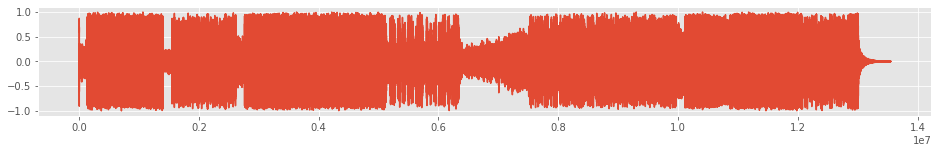

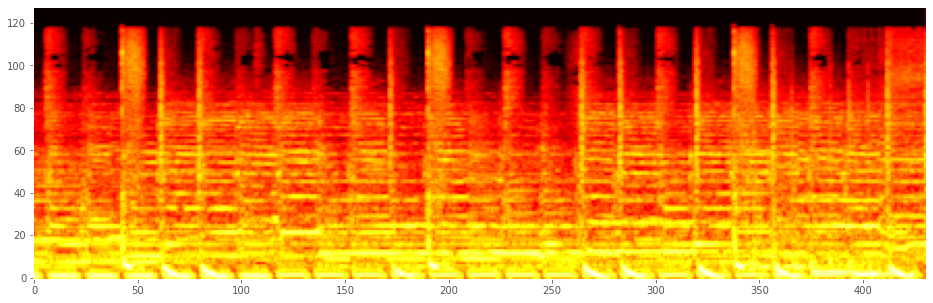

In [571]:
y, fs = lr.load('ieee754.mp3', sr=None)
display(Audio(y[:5*fs], rate=fs))

plt.figure(figsize=(16, 2))
plt.plot(y)
plt.show()

S = np.log(lr.feature.melspectrogram(y[180*fs:][:5*fs], sr=fs, n_mels=128) + 1e-5)

plt.figure(figsize=(16, 5))
plt.grid(False)
plt.imshow(S, aspect='auto', origin='lower')
plt.show()


### Chattanooga Temperatures

In [496]:
highs = []
for year in tqdm(range(1980, 2020 + 1)):
    with open(f'weather/723240-13882-{year}.op', 'r') as file:
        for line in file.readlines()[1:]:
            highs.append(min(float(line[102:108].strip()), 135))


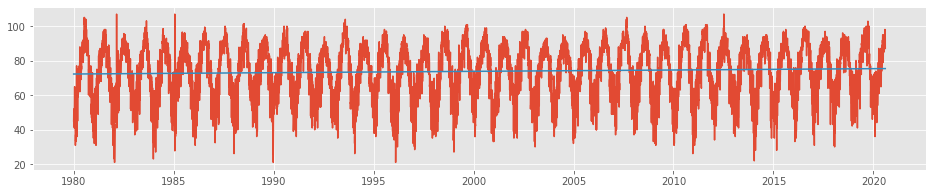

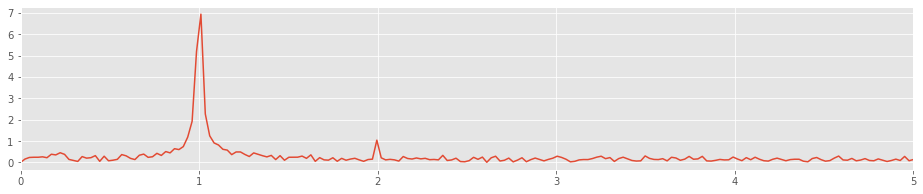

trend: 0.077 deg/year


In [508]:
y = np.array(highs)
x = np.arange(len(y))/365 + 1980
plt.plot(x, y)

m, b = np.polyfit(x, y, deg=1)
y_trend = m*x + b
plt.plot(x, y_trend)
plt.show()

y -= y_trend
Y = np.fft.rfft(y) / len(y)
plt.xlim(0, 5)
plt.plot(np.linspace(0, 365/2, len(Y)), np.abs(Y))
plt.show()
print(f"trend: {m:.3f} deg/year")


### French Power Consumption

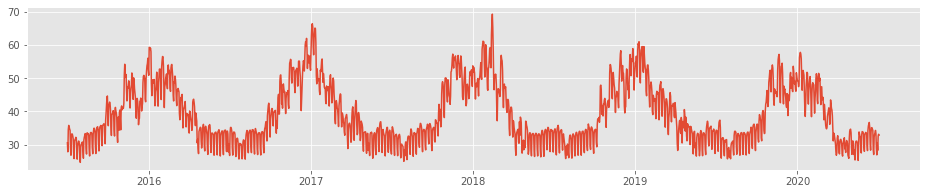

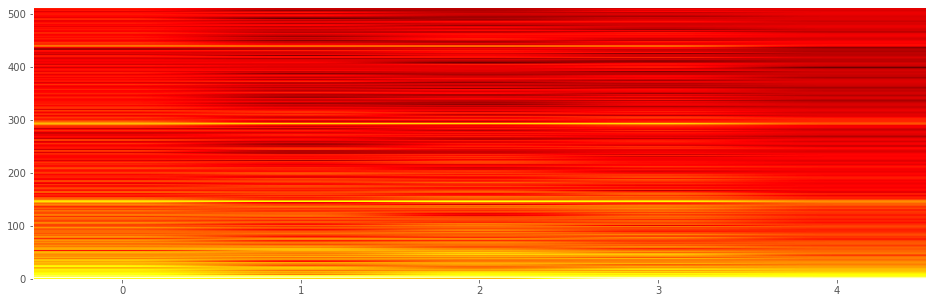

In [527]:
data = pd.read_csv('bilan-electrique-jour.csv', sep=';')
y = np.flip(data['Puissance moyenne journalière des consommations totales (W)']) / 1e9
x = np.arange(len(y))/365 + 2015.5
plt.plot(x, y)
plt.show()

Y = scipy.signal.stft(y, nperseg=1024, detrend='linear')[-1]
plt.figure(figsize=(16, 5))
plt.grid(False)
plt.imshow(np.log(np.abs(Y)), aspect='auto', origin='lower')
plt.show()


## Fourier Uncertainty

In [525]:
fs = 48000
f = 440
x = np.arange(fs)/fs
y = np.cos(2*π*f*x)

fig, (ax0, ax1) = plt.subplots(2, 1, figsize=(16, 5))
ax0.set_ylim(-1, 1)
ax1.set_xlim(400, 500)
ax1.set_ylim(0, 0.5)
plot0, = ax0.plot([0])
plot1, = ax1.plot([0])
fig.tight_layout()
plt.close()

def animate(frame):
    t = (np.exp(3*frame) - 1) / (np.exp(3) - 1)
    R = fs // f
    C = len(y) // R
    N = min((int(t * C) + 1) * R, len(y))
    Y = np.fft.rfft(y[:N])/N
    ax0.set_xlim(0, N)
    plot0.set_data((np.arange(N), y[:N]))
    plot1.set_data(np.linspace(0, fs/2, N//2+1), np.abs(Y))
    return plot0, plot1

anim = FuncAnimation(fig, animate, frames=frames, blit=True)
HTML(anim.to_html5_video())
